# Image Similarity using Similarity Metrics

## 💡 1. Introduction

### 1.1 Objective
In the [SIFT](https://github.com/i442124/SuperScope/blob/main/notebooks/feature-extraction/Feature_Extraction_SIFT.ipynb) feature extraction notebook, we've noticed a conciderable slowdown in computation times when dealing with larger collections. We want to find out if we can perform some kind of structural analysis on the images to strategically decide what images we want to perform feature descriptor matching on in the hopes of gaining a boost in performance when scanning the box art of a video game.

### 1.2 About this document
This document serves as a consistent environment to see and experiment how the different parameters can have an influence on finding the optimal set of images that we pass through to the SIFT feature descriptor matcher. In this document, I will write down all the thoughts, ideas, hypotheses and discoveries I've made along the way.

## ⚙️ 2. Settings

In [1]:
## SETTINGS FOR QUERY_IMAGES
QUERY_IMAGES_PATH = '../../data/box-art/samples/query-images'

## SETTINGS FOR TARGET IMAGES
TARGET_IMAGES_PATH = '../../data/box-art/samples/target-images'

## NORMALISATION METHOD USED FOR RMSE
## POSSIBLE CHOISES: ['euclidean','min-max', 'mean'] 
MSE_NORMALISATION_METHOD = 'min-max'

## 📚 3. Preperations

### 3.1 Importing libraries
For calculating the similarity between images I'm going to use the scikit-image module. Scikit-image is a collection of algorithms for image processing. Its available free of charge and free of restriction. More info about scikit-image can be found at https://scikit-image.org/

I've also included a [helper](https://github.com/i442124/SuperScope/blob/main/notebooks/feature-extraction/helper.py) module with some common functionality that we will see across all notebooks regarding image (pre)processing. This allows us to focus solely onto the topic of the structural similarity between images in this document. I'd recommend that you'd investigate this module at your own leisure after finishing this notebook.

In [2]:
import helper
import matplotlib
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import seaborn as sns

from skimage.metrics import mean_squared_error
from skimage.metrics import normalized_root_mse
from skimage.metrics import structural_similarity

### 3.2 Importing datasets
The datasets consist of two separate types of images called query images and target images. The query images are images captured with my mobile phone of the a video game. The target images are high quality rips of the box art images that can be found on the query images. The location of these images are provided by the `QUERY_IMAGES_PATH` and the `TARGET_IMAGES_PATH` variables.

In [3]:
QUERY_IMAGES = helper.load_images_in_dir(QUERY_IMAGES_PATH)
QUERY_IMAGES.head(5)

,label,image
0,animal.jpg,"[[[191, 188, 179], [190, 187, 178], [190, 185,..."
1,donkey.jpg,"[[[189, 184, 162], [189, 184, 162], [190, 185,..."
2,hyrule.jpg,"[[[175, 179, 164], [174, 178, 163], [172, 174,..."
3,mario.jpg,"[[[166, 163, 148], [167, 164, 149], [170, 167,..."
4,smash.jpg,"[[[147, 144, 125], [147, 144, 125], [150, 144,..."


In [4]:
TARGET_IMAGES = helper.load_images_in_dir(TARGET_IMAGES_PATH)
TARGET_IMAGES.head(5)

,label,image
0,animal.jpg,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."
1,donkey.jpg,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."
2,hyrule.jpg,"[[[207, 204, 197], [208, 205, 198], [210, 207,..."
3,mario.jpg,"[[[251, 251, 251], [254, 254, 254], [255, 255,..."
4,smash.jpg,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."


## 🎨 4. Spectating the images

### 4.1 Query Images
Let’s start off with looking at the query images I took. These images are supposed to represent a picture someone would take what they intend to scan a video game of interest. I purposefully added a little background noise and some glares from the light source onto the box-art to distort the image enough so we can be sure that the approach is flexible enough to be used the environment we are aiming for.

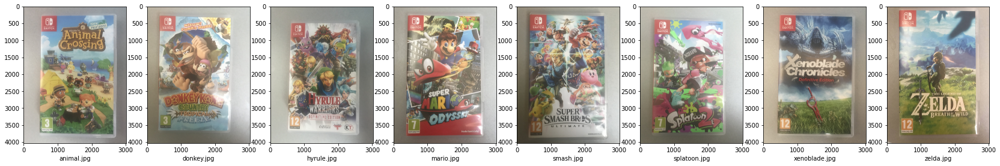

In [5]:
helper.spectate_image_set(QUERY_IMAGES)

### 4.2 Target Images
Next, we have the target images. These are the original box art images as they are provided with the game. They are supposed to be vibrant and clear with no noise nor distortions in lightning. They are the ideal 'target' of how a picture should look when captured with the camera. In optimal conditions, the query images should match these images exactly in terms of color and brightness.

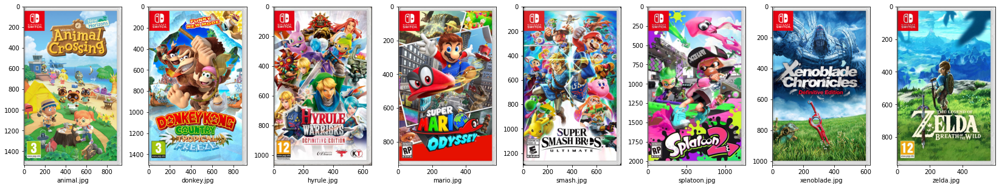

In [6]:
helper.spectate_image_set(TARGET_IMAGES)

### 5.1 Calculating similarity between images
There are two techniques we can use to calculate the similarity between images. The first method is by simply using the mean squared error (MSE). While simple to implement, it's not highly indicative of perceived similarity. Structural similarity (SSIM) aims to address this shortcoming by taking texture into account. 

Because of the unique use case that we have (an image that contains another image, that we want the similarity of), I'm interested in how these two techniques compare to each other and which one would be the better approach. My first guess would be that SSIM outperforms MSE by a long shot because the images are not quite the same and MSE cares a lot about absolute values, which is not really what we're dealing with.

In [7]:
def calculate_mse(IMG1, IMG2):
    return mean_squared_error(IMG1, IMG2)

In [8]:
def calculate_ssim(IMG1, IMG2):
    return structural_similarity(IMG1, IMG2, multichannel=True)

To compute the similarity between images, it's important that the images have the exact same shape! Because the target images are ideal in terms of dimensions and scale, let's scale the query image to the size of the target images. This might cause some slight distortions but should be negligible if the image was taken properly!

In [9]:
def r_calculate_mse(IMG1, IMG2):
    IMG2 = helper.resize_image(IMG2, *IMG1.shape[:2])
    return calculate_mse(IMG1, IMG2)

In [10]:
def r_calculate_ssim(IMG1, IMG2):
    IMG2 = helper.resize_image(IMG2, *IMG1.shape[:2])
    return calculate_ssim(IMG1, IMG2)

### 5.2 Similarity between query and target image
With all that out of the way, let's compute the similarity between the first image that we have in our datasets so see if everything works as expected. This will also give us an initial impression on how good everything works.

In [11]:
## EXTRACT THE FIRST IMAGES FROM
## THE QUERY AND TARGET IMAGE DATASETS
T_IMAGE = TARGET_IMAGES.iloc[0]['image']
Q_IMAGE = QUERY_IMAGES.iloc[0]['image']

## RESIZE THE QUERY IMAGE TO
## THE SAME DIMENSIONS AS THE TARGET
Q_IMAGE = helper.resize_image(Q_IMAGE, *T_IMAGE.shape[:2])

## CALCULATE THE MEAN SQUARED ERROR
T_MSE = calculate_mse(T_IMAGE, T_IMAGE)
Q_MSE = calculate_mse(Q_IMAGE, T_IMAGE)

## CALCULATE THE STRUCTURAL SIMILARITY
T_SSIM = calculate_ssim(T_IMAGE, T_IMAGE)
Q_SSIM = calculate_ssim(Q_IMAGE, T_IMAGE)

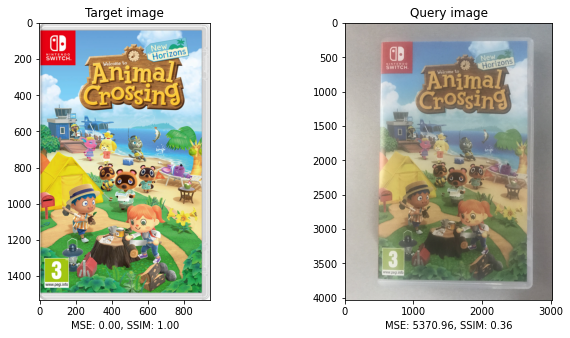

In [12]:
## INITIALIZE THE FIGURE
plt.figure(figsize=(9.6, 4.8))
label = 'MSE: {:.2f}, SSIM: {:.2f}'

## PLOT THE TARGET IMAGE
plt.subplot(1, 2, 1)
plt.title('Target image')
plt.imshow(TARGET_IMAGES.iloc[0]['image'])
plt.xlabel(label.format(T_MSE, T_SSIM))

## PLOT THE QUERY IMAGE
plt.subplot(1, 2, 2)
plt.title('Query image')
plt.imshow(QUERY_IMAGES.iloc[0]['image'])
plt.xlabel(label.format(Q_MSE, Q_SSIM))

## SHOW FIGURE
plt.tight_layout()
plt.show()

First impression are pretty good. SSIM reaches a score of 0.36 which is not half bad considering all the blurriness, distortions and poor lighting thats going on. MSE score is a little bit more difficult to judge, but given the resolution of the image I'd say it's still a pretty good score...

### 5.3 Spicing it up with multiple target images
Next, let's spice it up with some more target images to see if both SSIM and MSE are able to find the correct match. To mix things up lets also take a different query image. However to sort on the distance of the MSE, we need to make sure that we normalize the values before sorting them as the resolution between images differ quite a lot. I'm going to adapt to the normalized root-mean-square error, or NRMSE for short, to resolve this issue moving forward.

In [13]:
def calculate_nrmse(IMG1, IMG2):
    return normalized_root_mse(IMG1, IMG2, normalization=MSE_NORMALISATION_METHOD)

In [14]:
def r_calculate_nrmse(IMG1, IMG2):
    IMG2 = helper.resize_image(IMG2, *IMG1.shape[:2])
    return calculate_nrmse(IMG1, IMG2)

With the normalized values for MSE in place, we can start with calculating the distance values. We pass the method that (optionally) preprocesses the image to the correct resoltuion and returns the similarity score and apply it to the whole series.

In [15]:
def calculate_scores(Q_IMAGE, T_IMAGES, method):
    return T_IMAGES['image'].apply(method, args=[Q_IMAGE['image']])

In [16]:
Q_IMAGE = QUERY_IMAGES.iloc[1]
T_IMAGES = TARGET_IMAGES[['label', 'image']]

T_IMAGES['SSIM'] = calculate_scores(Q_IMAGE, T_IMAGES, r_calculate_ssim)
T_IMAGES['NRMSE'] = calculate_scores(Q_IMAGE, T_IMAGES, r_calculate_nrmse)
T_IMAGES[['label', 'SSIM', 'NRMSE']]

,label,SSIM,NRMSE
0,animal.jpg,0.348170,0.302432
1,donkey.jpg,0.251534,0.350213
2,hyrule.jpg,0.217256,0.355226
3,mario.jpg,0.160127,0.377210
4,smash.jpg,0.224516,0.386451
5,splatoon.jpg,0.339166,0.354241
6,xenoblade.jpg,0.175178,0.372027
7,zelda.jpg,0.223899,0.364373


With both the SSIM and NRMSE calculated let's stack them against each other see which one got the similarity the best! Depending on the method used, we need to sort the results in either ascending or descending order.

In [17]:
def plot_scores(Q_IMAGE, T_IMAGES, column, ascending=True):
    T_IMAGES = T_IMAGES.sort_values(by=column, ascending=ascending)
    T_IMAGES = T_IMAGES.reset_index()
    label = '{}: {:.3f}'
    
    plt.figure(figsize=(2.4*len(T_IMAGES), 4.8))
    plt.subplot(1, len(T_IMAGES) + 1, 1)
    plt.imshow(Q_IMAGE['image'])
    plt.xlabel(Q_IMAGE['label'])
    plt.xticks([])
    plt.yticks([])
    
    for row in T_IMAGES.index:
        plt.subplot(1, len(T_IMAGES) + 1, row + 2)
        plt.xlabel(label.format(column, T_IMAGES.loc[row][column]))
        plt.imshow(T_IMAGES.loc[row]['image'])
        plt.xticks([])
        plt.yticks([])

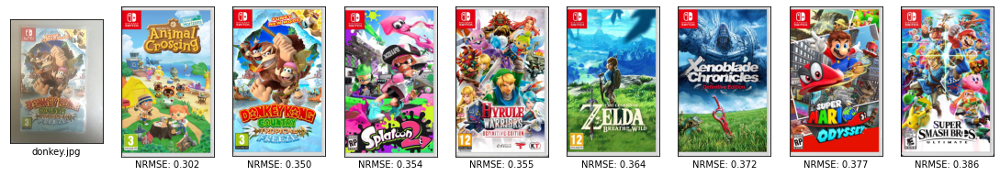

In [18]:
plot_scores(Q_IMAGE, T_IMAGES, column='NRMSE', ascending=True)

This one is really close! Sadly the differences between images are marginal at best so it might have gotten lucky when predicting which image most closely represents the query image. However given the distorted state of the query image that's still a great accomplishment on it's own.

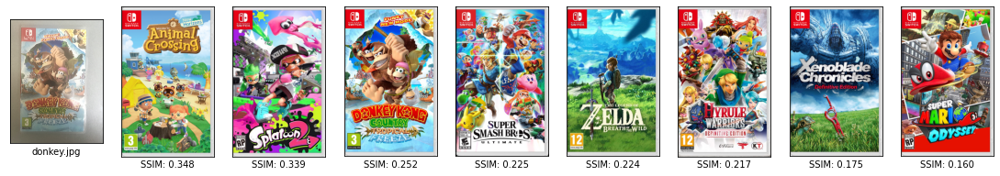

In [19]:
plot_scores(Q_IMAGE, T_IMAGES, column='SSIM', ascending=False)

I'm surprised that this one is underperforming compared to NRMSE but the target image is still in the top half which is commendable. This might be incidental but I'm not sure. We'd have to run some more tests to see if that is truly the case.

### 5.4 Combining the query and target images
Currently we've only been focusing on a single query image, but to get a better insight of how well these metrics perform let's check all possible combinations of query and target images by cross joining them together. Because the column names are the same for the query and target images, we need add a prefix (or suffix) to the column names to avoid collisions between column names.

In [20]:
def cross_match(queries, targets):
    
    # add prefix to query columns
    # and create a common cross join key
    c_queries = queries[['label', 'image']]
    c_queries = c_queries.add_prefix('query_')
    c_queries['key'] = 0

    # add prefix to target columns
    # and create a common cross join key
    c_targets = targets[['label', 'image']]
    c_targets = c_targets.add_prefix('target_')
    c_targets['key'] = 0

    # cross join the query and target images 
    # in the end, we should have N_QUERIES * N_TARGETS entries
    cross = pd.merge(c_queries, c_targets, on='key')
    cross = cross.drop(columns='key')
    return cross

In [21]:
cross = cross_match(QUERY_IMAGES, TARGET_IMAGES)
cross

,query_label,query_image,target_label,target_image
0,animal.jpg,"[[[191, 188, 179], [190, 187, 178], [190, 185,...",animal.jpg,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."
1,animal.jpg,"[[[191, 188, 179], [190, 187, 178], [190, 185,...",donkey.jpg,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."
2,animal.jpg,"[[[191, 188, 179], [190, 187, 178], [190, 185,...",hyrule.jpg,"[[[207, 204, 197], [208, 205, 198], [210, 207,..."
3,animal.jpg,"[[[191, 188, 179], [190, 187, 178], [190, 185,...",mario.jpg,"[[[251, 251, 251], [254, 254, 254], [255, 255,..."
4,animal.jpg,"[[[191, 188, 179], [190, 187, 178], [190, 185,...",smash.jpg,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
...,...,...,...,...
59,zelda.jpg,"[[[156, 138, 116], [159, 141, 119], [163, 145,...",mario.jpg,"[[[251, 251, 251], [254, 254, 254], [255, 255,..."
60,zelda.jpg,"[[[156, 138, 116], [159, 141, 119], [163, 145,...",smash.jpg,"[[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ..."
61,zelda.jpg,"[[[156, 138, 116], [159, 141, 119], [163, 145,...",splatoon.jpg,"[[[253, 253, 253], [252, 252, 252], [250, 250,..."
62,zelda.jpg,"[[[156, 138, 116], [159, 141, 119], [163, 145,...",xenoblade.jpg,"[[[252, 252, 252], [255, 255, 255], [255, 255,..."


### 5.5 SSIM vs (NR)MSE
With the cross join finished, we can start computing the distances between each query and target image for both SSIM and NRMSE. This way, we can see much more clearly if one is outperforming the other by looking at the placement of the images. We start off by calculating the distance itself and then plotting them into a grid like layout with each row ordered by the distance from the target image.

In [22]:
def cross_calculate_scores(cross, func):
    
    # compare the distance between the two images
    # using the comparison method provided and store
    # the values in a new dataframe
    comparison = pd.DataFrame(cross[['query_label', 'target_label']])
    comparison['distance'] = cross.apply(lambda x: func(x['target_image'], x['query_image']), axis=1)
    
    # pivot the dataframe so we can create a nice looking matrix
    return comparison.pivot(index='query_label', columns='target_label', values='distance')

In [23]:
def cross_plot_score_results(results, title, ascending):
    
    # calculate the total number
    # of rows and columns required
    nrows = len(results.index)
    ncols = len(results.columns) + 1
    
    # initialize the plot figure
    fig = plt.figure(figsize=(2.4*ncols, 3.6*nrows))
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=0.96)
    
    # loop through all rows in the matrix
    for y, (image, values) in enumerate(results.iterrows()):       
        plt.subplot(nrows, ncols, y * ncols + 1)
        plt.imshow(QUERY_IMAGES.iloc[y]['image'])
        plt.xlabel(image)
        plt.xticks([])
        plt.yticks([])
        
        # sort the values for each row individually
        values = values.sort_values(ascending=ascending)
        
        # loop through all cell values in the row
        for x, (image, value) in enumerate(values.iteritems()):
            target = TARGET_IMAGES.loc[TARGET_IMAGES['label'] == image].iloc[0]
            plt.subplot(nrows, ncols, y * ncols + 1 + x + 1)
            plt.xlabel(f'Value: {round(value, 3)}')
            plt.imshow(target['image'])
            plt.xticks([])
            plt.yticks([])

Let's start with checking the performance of NRMSE.

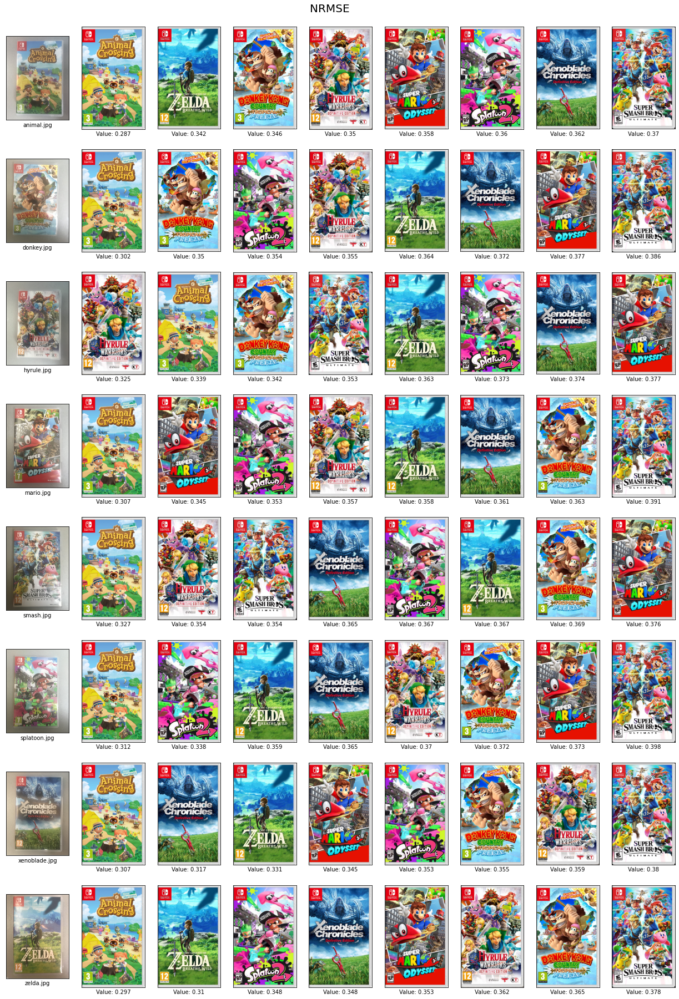

In [24]:
NRMSE_MATCHES = cross_calculate_scores(cross, r_calculate_nrmse)
cross_plot_score_results(NRMSE_MATCHES, 'NRMSE', ascending=True)

Pretty good! Not perfect but still very respectable. There is some kind of preference to animal crossing which is kind of odd if you ask me. I also think the values are a little too close to each other which doesn't leave us with a lot of wiggle room with the query image. What would happen if the angle of the query image was a little more off? Regardless, it passes the test of what I would consider an 'average' picture so it's up to standards in this regard.

Lets see how SSIM stacks up on this front.

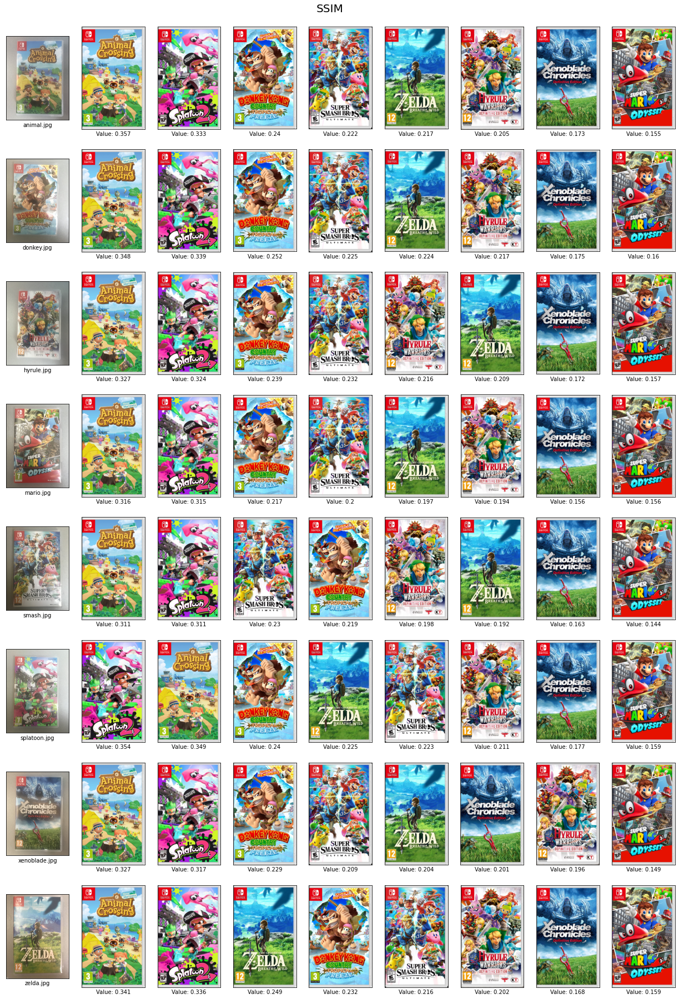

In [25]:
SSIM_MATCHES = cross_calculate_scores(cross, r_calculate_ssim)
cross_plot_score_results(SSIM_MATCHES, 'SSIM', ascending=False)

Yikes, this one is quite disappointing to see. It looks like SSIM is not picking up on the important keypoints and is having difficulties in understanding the bigger picture of the image. I'd expect that if we were to lower the resolution of the images, the smaller inconsistencies will start to fade and the texture would become more obvious and the similarity would actually increase as a result.

## ⏰ 6. Time is of the essence
When looking at the computation times of both NRMSE and SSIM it takes quite a while for them to come up with results. If we were to perform these operations on an even larger dataset we get to the point that we might as well skip this process entirely and start with feature descriptor matching immediately. However we can do a few things that could possibly speed up this entire process.

### 6.1 Less is more?
When we look at the resolution of the target images, some of them get to a pretty high resolution (over 1000x1000) pixels. This is quite a lot of information to process and when we look at the similarity between images this might obstruct the overall texture of the image. Therefore it might actually be a win-win if we were to lower the resolution of all the images to a smaller size for both performance and accuracy benefits.

In [26]:
def cross_scale_images(width, height):
    targets = helper.load_images_in_dir(TARGET_IMAGES_PATH)
    targets['image'] = targets['image'].apply(helper.resize_image, args=[height, width]) 
    queries = helper.load_images_in_dir(QUERY_IMAGES_PATH)
    queries['image'] = queries['image'].apply(helper.resize_image, args=[height, width])  
    return cross_match(queries, targets)

Let's create a few downscaled image sets that we can use to see if there is an increase the performance and/or accuracy for either SSIM and NRMSE.

In [27]:
IMAGE_SETS = (
    ("128x", cross_scale_images(width=128, height=128)),
    ("64x", cross_scale_images(width=64, height=64)),
    ("32x", cross_scale_images(width=32, height=32)),
    ("16x", cross_scale_images(width=16, height=16)),
    ("8x", cross_scale_images(width=8, height=8)))

With the image sets generated, we can start calculating the NRSME and SSIM scores at the different downscaled levels to see how well everything performs when we remove some of the details in the images.

In [28]:
results = {}
for (scale, cross) in IMAGE_SETS:
    ssim_scores = cross_calculate_scores(cross, calculate_ssim)
    nrmse_scores = cross_calculate_scores(cross, calculate_nrmse)
    results[scale] = { 'SSIM': ssim_scores, 'NRSME': nrmse_scores }

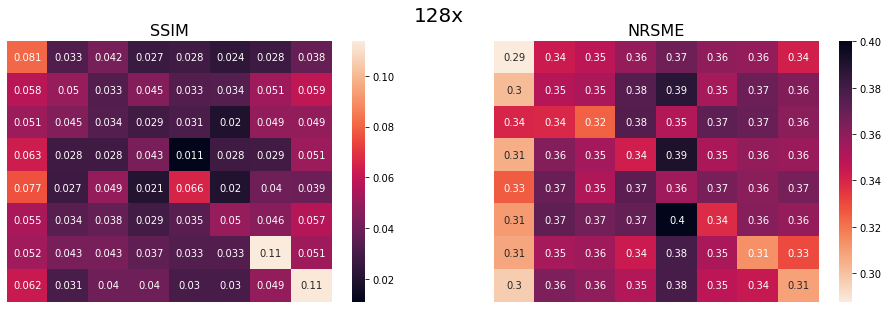

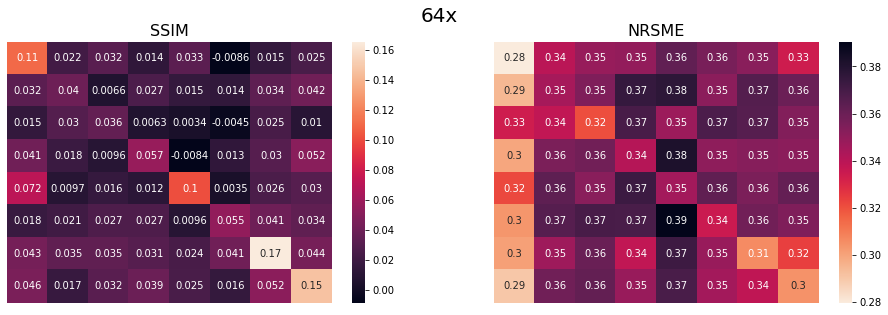

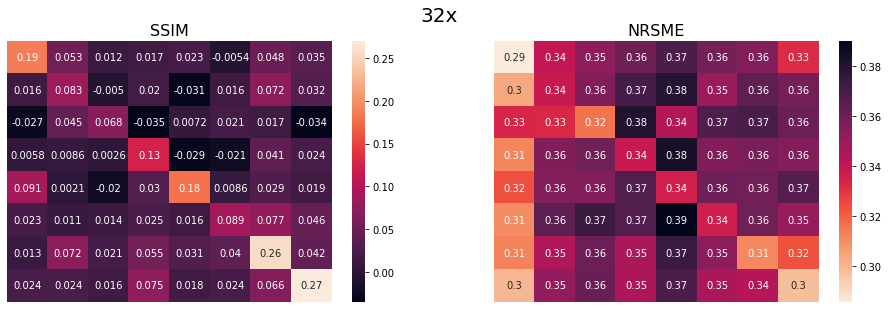

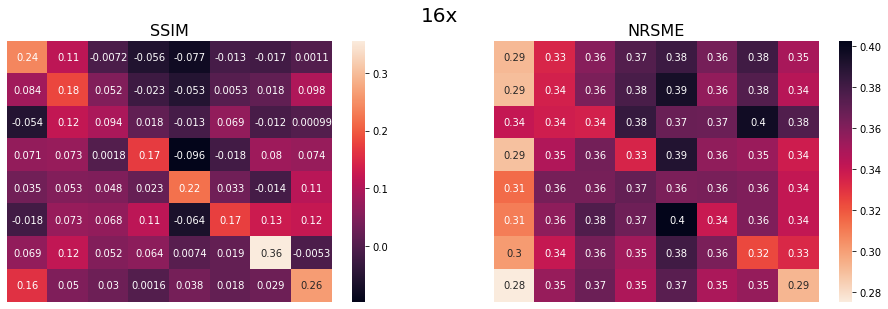

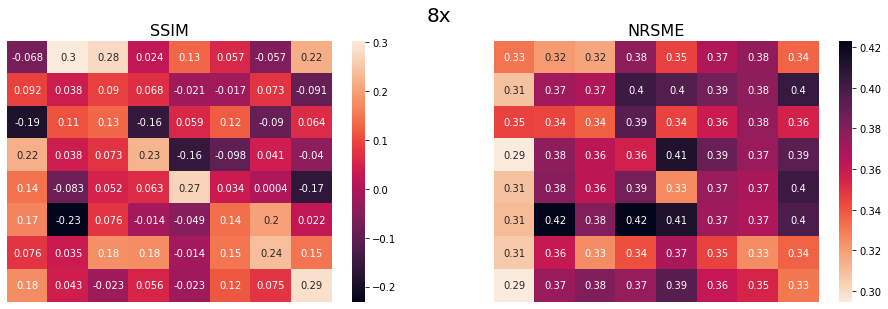

In [29]:
for (scale) in results:
    plt.figure(figsize=(16.0, 4.8))
    plt.suptitle(scale, fontsize=20)

    plt.subplot(1, 2, 1)
    plt.title('SSIM', fontsize=16)
    sns.heatmap(results[scale]['SSIM'], annot=True, cmap=sns.cm.rocket,  xticklabels=[], yticklabels=[])
    plt.xlabel('')
    plt.ylabel('')

    plt.subplot(1, 2, 2)
    plt.title('NRSME', fontsize=16)
    sns.heatmap(results[scale]['NRSME'], annot=True, cmap=sns.cm.rocket_r, xticklabels=[], yticklabels=[])
    plt.xlabel('')
    plt.ylabel('')

Now SSIM start to perform a lot better! We can see a clear diagonal line on the 32x and 16x scaled images, which is where the query and target images of the same box art line up. At the 8x scale we've lost too much information for SSIM to operate properly.

NRSME seems to not let go of animal crossing... Although at first glance it looks like the NRSME is all over the place when you look at the actual annotation values it's finding the correct match in either first or second place, if only by a small margin so it's still keeping up with SSIM in that regard.

### 6.2 Time is ticking
It's important to remember we are NOT looking for the best match, we're trying to eliminate the worst matches. We want this to be done as fast as possible, so even if NRSME is not as accurate as SSIM if it's 100x faster in calculation times and is able to keep the target image somewhere in the top results, it might still have an edge over SSIM for the use case we are going for. To get a better estimate on how these metrics operate on larger datasets, lets load in the images from the data storage solution.

In [30]:
%store -r images
print(f'Number of images in the dataset: {len(images)}')

Number of images in the dataset: 6362


Due to the amount of games in the data storage solution I've only gathered the box-art images of the top 1000 games for the time being. This means we'll have to limit the selection of games to only the most popular entries that exists in this dataset.

In [31]:
TEST_IMAGES = (
    ('Animal Crossing', 'Animal Crossing: New Horizons', 
     helper.resize_image(QUERY_IMAGES.iloc[0]['image'], 16, 16)),
    ('Super Mario', 'Super Mario Odyssey', 
     helper.resize_image(QUERY_IMAGES.iloc[3]['image'], 16, 16)),
    ('Super Smash', 'Super Smash Bros. Ultimate',
     helper.resize_image(QUERY_IMAGES.iloc[4]['image'], 16, 16)),
    ('Xenoblade', 'Xenoblade Chronicles: Definitive Edition', 
     helper.resize_image(QUERY_IMAGES.iloc[6]['image'], 16, 16)),
    ('Zelda', 'The Legend of Zelda: Breath of the Wild', 
     helper.resize_image(QUERY_IMAGES.iloc[7]['image'], 16, 16))
)

Next we need to look for the `GROUND_TRUTH` in the large dataset, which essentially means that we need to match the query images to all possible correct answers in the dataset. There can be multiple box-art images associated to the same game, due to regional differences. As long as we match with one of them, it's a proper match.

In [32]:
results = {}
for (name, title, structure) in TEST_IMAGES:
    GROUND_TRUTH = images[images['title'] == title].index
    results[name] = {'TRUTH': GROUND_TRUTH }

With the correct answers located in the dataset, we can start looking for the best possible matches according to SSIM and NRMSE. There are two factors to consider, speed and rank. Speed is the time it takes to sort all the values in the dataset according to the metric used. Rank is the placement of the (first) correct answer in the dataset. Speed will be measured during execution while the ranking will be checked afterwards.

In [33]:
def best_ssim_matches(structure):
    matches = pd.DataFrame(images[['structure']])
    matches['similarity'] = matches['structure'].apply(calculate_ssim, args=[structure])
    return matches.sort_values(by='similarity', ascending=False).rename_axis('id').reset_index()

In [34]:
def best_nrmse_matches(structure):
    matches = pd.DataFrame(images[['structure']])
    matches['similarity'] = matches['structure'].apply(calculate_nrmse, args=[structure])
    return matches.sort_values(by='similarity', ascending=True).rename_axis('id').reset_index()

In [35]:
for (name, title, structure) in TEST_IMAGES:
    %time SSIM_SCORES = best_ssim_matches(structure)
    results[name]['SSIM'] = SSIM_SCORES

Wall time: 2.47 s
Wall time: 2.49 s
Wall time: 2.5 s
Wall time: 2.43 s
Wall time: 2.45 s


In [36]:
for (name, title, structure) in TEST_IMAGES:
    %time NRMSE_SCORES = best_nrmse_matches(structure)
    results[name]['NRMSE'] = NRMSE_SCORES

Wall time: 178 ms
Wall time: 180 ms
Wall time: 181 ms
Wall time: 181 ms
Wall time: 176 ms


In regards to time, there is a noticeable stutter of at least 2 seconds before we have obtained the results when using the SSIM method. This could potentially become a problem when the dataset will grow in the future. For NRMSE the results are almost instantaneous, which is a huge improvement over SSIM in terms of speed, but accuracy is also very important, so let's check on that.

In [37]:
for name in results:
    SSIM_RESULTS = results[name]['SSIM']
    print(f"({name}) found at: {SSIM_RESULTS[SSIM_RESULTS['id'].isin(results[name]['TRUTH'])].index[0]}")

(Animal Crossing) found at: 697
(Super Mario) found at: 231
(Super Smash) found at: 16
(Xenoblade) found at: 0
(Zelda) found at: 36


In [38]:
for name in results:
    NRMSE_RESULTS = results[name]['NRMSE']
    print(f"({name}) found at: {NRMSE_RESULTS[NRMSE_RESULTS['id'].isin(results[name]['TRUTH'])].index[0]}")

(Animal Crossing) found at: 94
(Super Mario) found at: 396
(Super Smash) found at: 278
(Xenoblade) found at: 161
(Zelda) found at: 4


Results are mixed but decent on both metrics, but it looks like SSIM is performing better than NRMSE. It's general placement of the correct images can be found earlier in the list (indicated by the lower numbers) which would allow us to more narrowly filter on the amount of images we pass through to SIFT.

Regardless I think both methods would suffice in solving the problem at hand but with NRMSE's speed benefits I'm leaning towards using this for the final implementation.

## 📝 7. Conclusion

We've attempted to search for similarities between images using both SSIM and NRMSE.
* `SSIM` Only performs well if images are properly preprocessed by downscaling them to a resolution between 32x32 and 16x16. Performance is quite slow compared to NRMSE. However using SSIM in combination with SIFT is still faster than SIFT as a standalone.
* `NRMSE` About equal to slightly worse than SSIM in terms of accuracy. However, NRMSE is way faster than SSIM which is an important factor to consider. Due to the limited size of images available, there might be some conditions in which SSIM clearly beats NRMSE in terms of accuracy but they have yet to be discovered.

For the final implementation, I'm leaning towards using NRMSE over SSIM due to it's speed benefits. We are not looking for the best match (we have SIFT for that!) but want to eliminate the worst matches as fast as possible due to the size of the image dataset. As long as the query image is somewhere in the top results, which NRMSE is more than capable of providing, we should be good to go.

One feature we lose out on when implementing this filter mechanism is the scale/rotation invariance provided by SIFT. What this means is that we can no longer rotate/angle the camera and the image needs to be fully in frame for it to properly work, but the benefits are that we get a massive boost in performance, which to me is well worth the price.